In [24]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib_inline

UsageError: Line magic function `%matplotlib_inline` not found.


In [2]:
data = pd.read_excel("ICU_prediction.xlsx")

In [3]:
data

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,...,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0-2,0
1,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,2-4,0
2,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4-6,0
3,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,NaN,NaN,NaN,NaN,-1.000000,-1.000000,6-12,0
4,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-0.238095,-0.818182,-0.389967,0.407558,-0.230462,0.096774,-0.242282,-0.814433,ABOVE_12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1920,384,0,50th,1,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0-2,0
1921,384,0,50th,1,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,2-4,0
1922,384,0,50th,1,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,4-6,0
1923,384,0,50th,1,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,6-12,0


In [4]:
data.shape

(1925, 231)

In [5]:
data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1925 entries, 0 to 1924
Data columns (total 231 columns):
 #    Column                            Dtype  
---   ------                            -----  
 0    PATIENT_VISIT_IDENTIFIER          int64  
 1    AGE_ABOVE65                       int64  
 2    AGE_PERCENTIL                     object 
 3    GENDER                            int64  
 4    DISEASE GROUPING 1                float64
 5    DISEASE GROUPING 2                float64
 6    DISEASE GROUPING 3                float64
 7    DISEASE GROUPING 4                float64
 8    DISEASE GROUPING 5                float64
 9    DISEASE GROUPING 6                float64
 10   HTN                               float64
 11   IMMUNOCOMPROMISED                 float64
 12   OTHER                             float64
 13   ALBUMIN_MEDIAN                    float64
 14   ALBUMIN_MEAN                      float64
 15   ALBUMIN_MIN                       float64
 16   ALBUMIN_MAX           

In [6]:
data.select_dtypes(object)

,AGE_PERCENTIL,WINDOW
0,60th,0-2
1,60th,2-4
2,60th,4-6
3,60th,6-12
4,60th,ABOVE_12
...,...,...
1920,50th,0-2
1921,50th,2-4
1922,50th,4-6
1923,50th,6-12


In [7]:
data['AGE_P'] = data['AGE_PERCENTIL'].str.extract('(\d+)').astype(int)
data['AGE_P']

0       60
1       60
2       60
3       60
4       60
        ..
1920    50
1921    50
1922    50
1923    50
1924    50
Name: AGE_P, Length: 1925, dtype: int64

In [8]:
data.drop(['AGE_PERCENTIL','WINDOW'],axis=1,inplace=True)


In [9]:
data.columns

Index(['PATIENT_VISIT_IDENTIFIER', 'AGE_ABOVE65', 'GENDER',
       'DISEASE GROUPING 1', 'DISEASE GROUPING 2', 'DISEASE GROUPING 3',
       'DISEASE GROUPING 4', 'DISEASE GROUPING 5', 'DISEASE GROUPING 6', 'HTN',
       ...
       'TEMPERATURE_DIFF', 'OXYGEN_SATURATION_DIFF',
       'BLOODPRESSURE_DIASTOLIC_DIFF_REL', 'BLOODPRESSURE_SISTOLIC_DIFF_REL',
       'HEART_RATE_DIFF_REL', 'RESPIRATORY_RATE_DIFF_REL',
       'TEMPERATURE_DIFF_REL', 'OXYGEN_SATURATION_DIFF_REL', 'ICU', 'AGE_P'],
      dtype='object', length=230)

In [15]:
data.dropna(axis=0,inplace=True)

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 545 entries, 4 to 1924
Columns: 230 entries, PATIENT_VISIT_IDENTIFIER to AGE_P
dtypes: float64(225), int64(5)
memory usage: 983.6 KB


In [19]:
data['ICU'].value_counts()

0    281
1    264
Name: ICU, dtype: int64

In [26]:
X = data.drop('ICU',axis=1)
y = data['ICU']

In [28]:
from sklearn.model_selection import train_test_split

In [29]:
X_train, X_test, y_train, y_test = train_test_split(
...     X, y, test_size=0.3, random_state=0)

X_train.shape , X_test.shape

((381, 229), (164, 229))

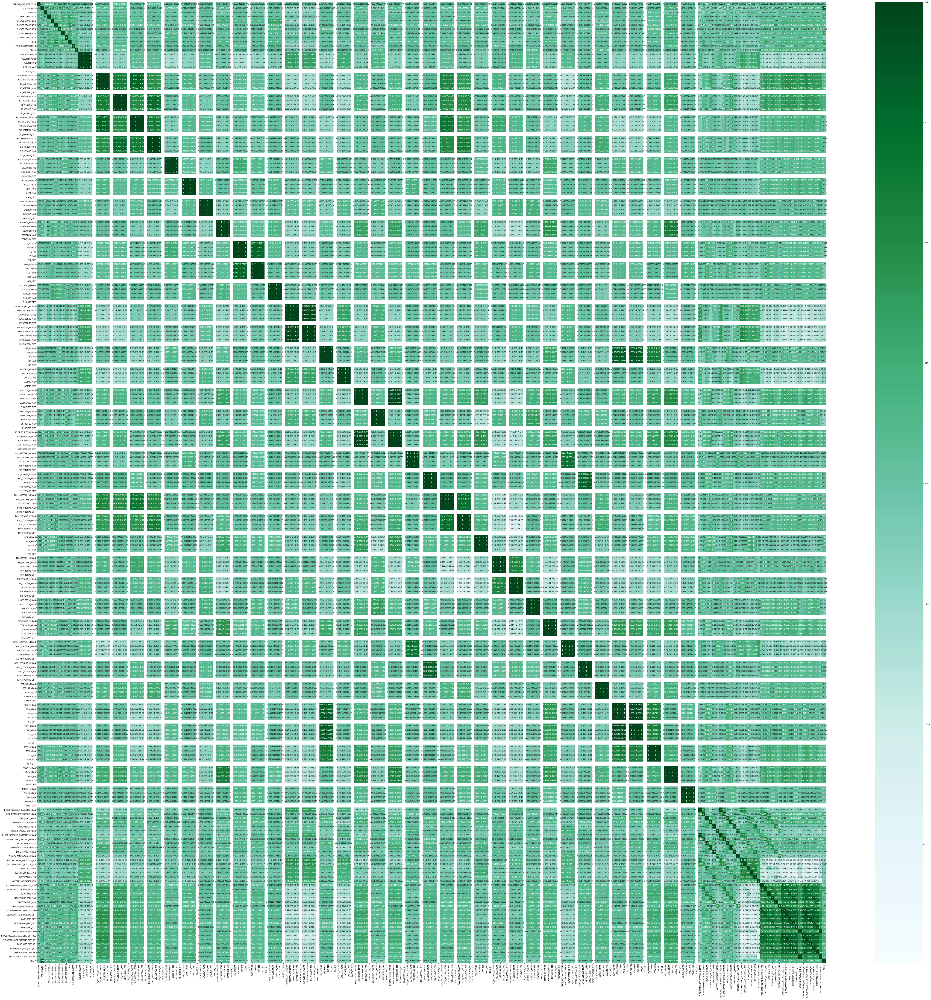

In [32]:
import seaborn as sns
plt.figure(figsize=(100,100))
cor=X_train.corr()
sns.heatmap(cor,annot=True, cmap=plt.cm.BuGn)
plt.show()

In [36]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [37]:
corr_features = correlation(X_train, 0.9)
len(set(corr_features))

123

In [38]:
X_train = X_train.drop(corr_features,axis=1)
X_test = X_test.drop(corr_features,axis=1)

In [73]:
X_train.head()

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,...,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,AGE_P
1615,323,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.223881,-0.090909,0.478261,0.684211,-0.843478,-0.803681,-0.984733,-1.000000,-0.939394,40
1396,279,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.492537,-0.636364,-0.014493,0.894737,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,50
824,164,1,0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.179104,-0.151515,0.362319,0.894737,-0.373913,-0.447853,-0.053435,-0.238095,0.959596,70
970,194,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.567164,-0.575758,0.014493,0.736842,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,80
889,177,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.044776,-0.333333,-0.014493,1.000000,-0.460870,-0.509202,-0.236641,-0.428571,-0.878788,10


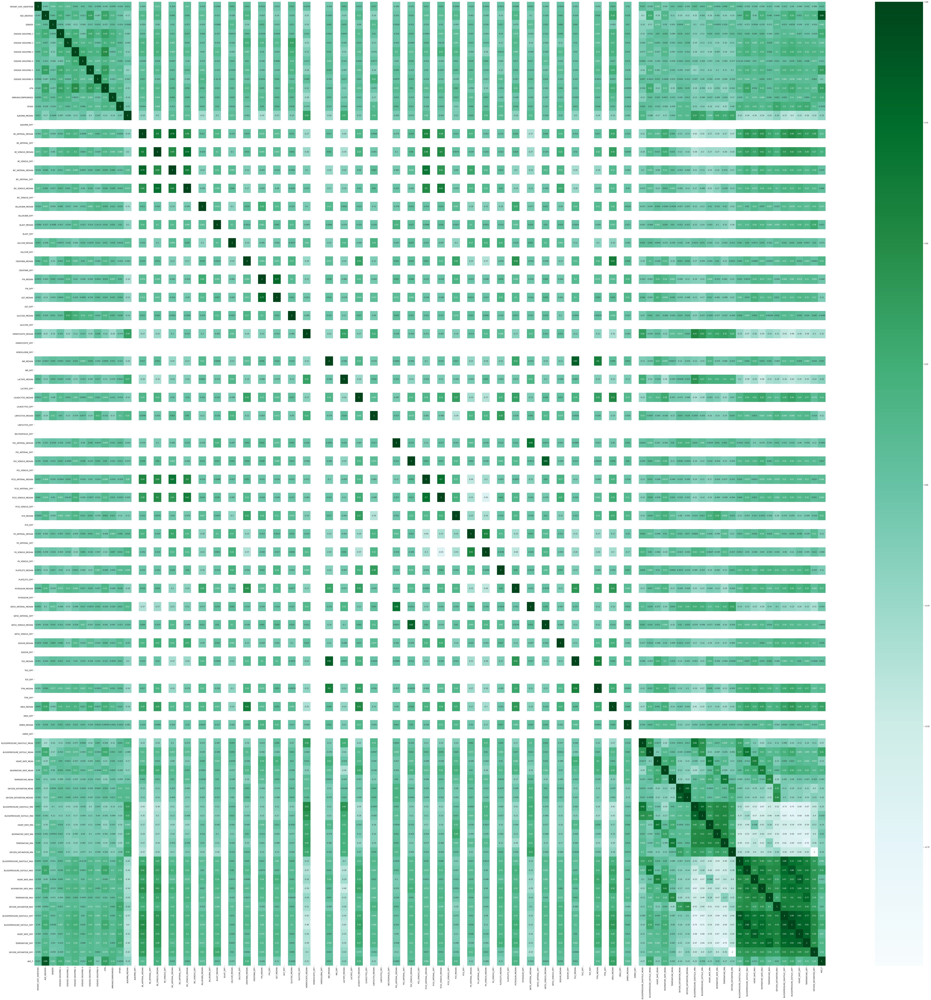

In [74]:
import seaborn as sns
plt.figure(figsize=(100,100))
cor=X_train.corr()
sns.heatmap(cor,annot=True, cmap=plt.cm.BuGn)
plt.show()

In [41]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn import svm
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt 
from sklearn.metrics import log_loss
from sklearn import tree

from sklearn.neural_network import MLPClassifier

In [58]:
def res(y_true,y_pred):
  tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
  accuracy=(tp+tn)/(tp+fp+fn+tn)
  specificity = tn/(tn+fp)
  sensitivity=tp/(tp+fn)
  print("Accuracy:",accuracy*100)
  print("Sensitivity:",sensitivity*100)
  print("Specificity:",specificity*100)
  print("ROC_AUC_Score:",roc_auc_score(y_true, y_pred)*100)

In [59]:
lgc=make_pipeline(LogisticRegressionCV(cv=5,random_state=1,max_iter=10000))
lgc.fit(X_train, y_train)
y_pred=lgc.predict(X_test)
res(y_test,y_pred)

Accuracy: 85.36585365853658
Sensitivity: 88.05970149253731
Specificity: 83.50515463917526
ROC_AUC_Score: 85.7824280658563


In [70]:
SVM_object = make_pipeline(svm.SVC(kernel='linear'))
SVM_object.fit(X_train,y_train)
y_pred=SVM_object.predict(X_test)
res(y_test,y_pred)

Accuracy: 83.53658536585365
Sensitivity: 88.05970149253731
Specificity: 80.41237113402062
ROC_AUC_Score: 84.23603631327897


In [51]:
from sklearn.feature_selection import RFE
lr = LogisticRegression()

In [56]:
rfe = RFE(estimator=lr, step=1)
rfe = rfe.fit(X_train, y_train)

/home/rishi/anaconda3/envs/first/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/rishi/anaconda3/envs/first/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

/home/rishi/anaconda3/envs/first/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/rishi/anaconda3/envs/first/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

In [54]:
selected_rfe_features = pd.DataFrame({'Feature':list(X_train.columns),
                                      'Ranking':rfe.ranking_})
selected_rfe_features.sort_values(by='Ranking')

,Feature,Ranking
50,P02_VENOUS_MEDIAN,1
41,LACTATE_MEDIAN,1
43,LEUKOCYTES_MEDIAN,1
45,LINFOCITOS_MEDIAN,1
48,P02_ARTERIAL_MEDIAN,1
...,...,...
105,AGE_P,50
77,UREA_MEDIAN,51
20,BIC_VENOUS_MEDIAN,52
58,PH_ARTERIAL_MEDIAN,53


In [64]:
x_train_rfe = rfe.transform(X_train)
x_test_rfe = rfe.transform(X_test)

In [65]:
x_train_rfe.shape

(381, 53)

In [60]:
lgc=make_pipeline(LogisticRegressionCV(cv=5,random_state=1,max_iter=10000))
lgc.fit(x_train_rfe, y_train)
y_pred=lgc.predict(x_test_rfe)
res(y_test,y_pred)

Accuracy: 86.58536585365853
Sensitivity: 88.05970149253731
Specificity: 85.56701030927834
ROC_AUC_Score: 86.81335590090784


In [69]:
SVM_object = make_pipeline(svm.SVC(kernel='linear'))
SVM_object.fit(x_train_rfe,y_train)
y_pred=SVM_object.predict(x_test_rfe)
res(y_test,y_pred)

Accuracy: 86.58536585365853
Sensitivity: 88.05970149253731
Specificity: 85.56701030927834
ROC_AUC_Score: 86.81335590090784
